In [11]:
import yfinance as yf
import pandas as pd
import mplfinance as mpf
import os

from datetime import timedelta, datetime

import IPython.display as IPydisplay

import tensorflow as tf
from tensorflow.keras import layers, models
import numpy as np
import matplotlib.pyplot as plt

Q1 What's the price movement, trends, market sentiment of the current market?

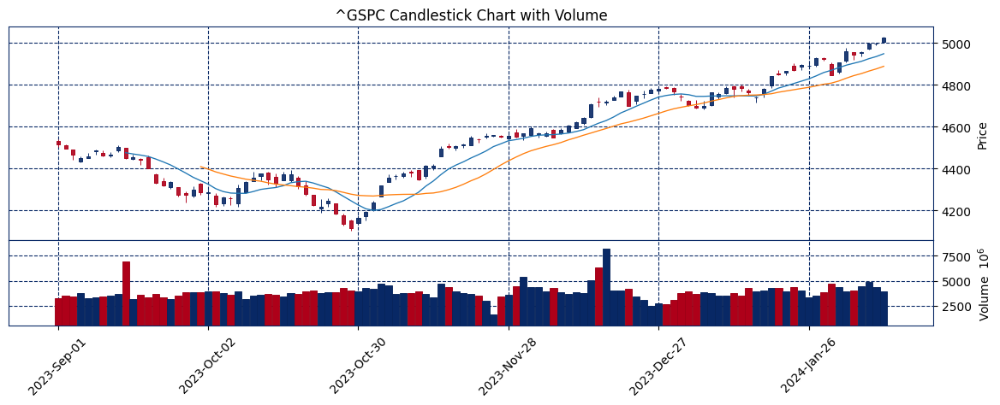

In [171]:
# Define the stock symbol
stock_symbol = "^GSPC"
start_date = datetime(2023, 9, 1)
end_date = datetime(2024, 2, 10)

# Download the stock data
stock_data = yf.download(stock_symbol, start=start_date.strftime("%Y-%m-%d"), end=end_date.strftime("%Y-%m-%d"), progress=False)

# Customize the plot
mpf_style = 'starsandstripes'  # Style: https://github.com/matplotlib/mplfinance/blob/master/examples/styles.ipynb
fig_size = (15, 5)  # width, height in inches

# Adding a moving average
moving_averages = [10, 20]  # Days for moving averages

# Create a figure and axes to control the size more finely
fig, axes = mpf.plot(stock_data, 
                     type='candle', 
                     volume=True, 
                     style=mpf_style, 
                     figsize=fig_size,
                     mav=moving_averages,
                     returnfig=True)

# Customize the plot further if needed
# For example, adding a title
axes[0].set_title(f'{stock_symbol} Candlestick Chart with Volume')

# Show the plot
mpf.show()


Looking at the price movement:

The chart starts off in a downtrend as evidenced by a series of red candlesticks that indicate closing prices lower than opening prices.
Around early October, the trend reverses, and we see a predominant upward trend. This is marked by an increasing number of blue candlesticks, which show that closing prices are higher than opening prices.
The two moving averages (10-day and 20-day) start to slope upwards, confirming the bullish trend.
In late November and early December, there are spikes in trading volume accompanying the price increase, which suggests strong buying interest.
The price continues to trend upward, consistently making higher highs and higher lows, a classic sign of a bullish trend.
As for market sentiment:

The initial red candlesticks with high volume indicate bearish sentiment in early September.
The shift to blue candlesticks and the price moving above the moving averages reflect a change to bullish market sentiment.
The volume is relatively higher on days with blue candlesticks, reinforcing the idea that there is strong buying pressure driving the prices up.
Possible trends:

The two moving averages serve as dynamic support levels. The price does not dip below these lines after the trend reversal, which suggests the market is respecting these levels as areas of buying interest.
The moving averages are sloping upwards and the price is making higher highs and higher lows, both of which indicate a strong upward trend.
There's no clear sign of a reversal pattern towards the end of the chart, suggesting the upward trend may continue.
Overall, the market sentiment appears to be bullish based on this period, with a strong upward trend indicated by both the price action and the moving averages.

Q2. Do prices really have pattern?

In [15]:
# how many candlesticks in an image
sticks = 14
stock_symbol = "^GSPC"
style = mpf.make_mpf_style(base_mpf_style='nightclouds', 
                           rc={'axes.labelcolor': 'none', 'xtick.color': 'none', 'ytick.color': 'none', 'axes.spines.bottom': False, 
                               'axes.spines.left': False, 'axes.spines.right': False, 'axes.spines.top': False, 'axes.titlesize': 'xx-small'})


In [58]:
# generate full images
# Initial start date
initial_start_date = datetime(1990, 1, 1)

# Number of images to generate
num_images = 8580

# how many candlesticks in an image
sticks = 14

# Initialize variable to store previous stock data
stock_data_prev = None

# Counter for the number of images generated
images_generated = 0
i = 0

# Define a minimal style
style = mpf.make_mpf_style(base_mpf_style='nightclouds', 
                           rc={'axes.labelcolor': 'none', 'xtick.color': 'none', 'ytick.color': 'none', 'axes.spines.bottom': False, 
                               'axes.spines.left': False, 'axes.spines.right': False, 'axes.spines.top': False, 'axes.titlesize': 'xx-small'})

# Loop to generate each image
end_date = initial_start_date
while images_generated < num_images and end_date < datetime.today():
    # Calculate the start and end date for this iteration
    start_date = initial_start_date + timedelta(days=images_generated+i)
    end_date = start_date + timedelta(days=sticks)
    

    # Load historical data for the current date range
    stock_data = yf.download(stock_symbol, start=start_date.strftime("%Y-%m-%d"), end=end_date.strftime("%Y-%m-%d"), progress=False)

    check_len = len(stock_data) - sticks

    while check_len < 0:
        end_date = end_date + timedelta(days=1)
        stock_data = yf.download(stock_symbol, start=start_date.strftime("%Y-%m-%d"), end=end_date.strftime("%Y-%m-%d"), progress=False)
        check_len = len(stock_data) - sticks

        # print(len(stock_data))
        # print(check_len)

    if stock_data.equals(stock_data_prev):
        i+=1
        
    if stock_data_prev is None or not stock_data.equals(stock_data_prev):

        stock_data_prev = stock_data.copy()

        # Ensure index is a DatetimeIndex
        stock_data.index = pd.to_datetime(stock_data.index)
        
        # Define a unique filename for each image
        # filename = f'images/candlestick_{start_date.year}_{start_date.month}_{start_date.day}.png'
        filename = f'fullimages/candlestick_{start_date.year}-{start_date.month:02d}-{start_date.day:02d}.png'
    
        # Plot and save the figure
        mpf.plot(stock_data, type='candle', volume=False, style=style, savefig=filename)

        # Increment the counter for images generated
        images_generated += 1


1 Failed download:
['^GSPC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2024-01-24 -> 2262-04-12)')

1 Failed download:
['^GSPC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2024-01-24 -> 2262-04-13)')

1 Failed download:
['^GSPC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2024-01-24 -> 2262-04-14)')

1 Failed download:
['^GSPC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2024-01-24 -> 2262-04-15)')

1 Failed download:
['^GSPC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2024-01-24 -> 2262-04-16)')

1 Failed download:
['^GSPC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2024-01-24 -> 2262-04-17)')

1 Failed download:
['^GSPC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2024-01-24 -> 2262-04-18)')

1 Failed download:
['^GSPC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2024

In [3]:
import numpy as np
import os
import shutil
from sklearn.cluster import KMeans
from tensorflow.keras.applications import VGG16
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.models import Model

# Parameters
image_folder = 'fullimages/'  # Update this with the actual path to your images folder
clustered_dir = 'clustered/'
num_clusters = 16  # Define the number of clusters

# Load VGG16 model pre-trained on ImageNet data
model = VGG16(weights='imagenet', include_top=False)

# Load and preprocess images
def load_image(img_path):
    # img = image.load_img(img_path, target_size=(224, 224))
    img = image.load_img(img_path)
    img_data = image.img_to_array(img)
    img_data = np.expand_dims(img_data, axis=0)
    img_data = preprocess_input(img_data)
    return img_data

# Create a feature extractor model
feature_extractor = Model(inputs=model.input, outputs=model.output)

# Get a list of image paths
image_files = [os.path.join(image_folder, img) for img in os.listdir(image_folder) if img.endswith('.png')]

# Extract features from each image
features = np.vstack([feature_extractor.predict(load_image(img_path)) for img_path in image_files])

# Flatten the features to fit the K-means input
flattened_features = features.reshape(features.shape[0], -1)

# Define and fit the K-means model
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
kmeans.fit(flattened_features)

# Get cluster assignments for each image
cluster_assignments = kmeans.labels_

# Create target directories for each cluster and copy images
for i in range(num_clusters):
    # Create a directory for the cluster
    cluster_dir = os.path.join(clustered_dir, f'cluster_{i}')
    os.makedirs(cluster_dir, exist_ok=True)
    
    # Find and copy images into their respective cluster directories
    cluster_indices = np.where(cluster_assignments == i)[0]
    for index in cluster_indices:
        # Original image path
        img_path = image_files[index]
        # Target path for the image in the cluster directory
        target_path = os.path.join(cluster_dir, os.path.basename(img_path))
        # Copy the image to the new directory
        shutil.copy(img_path, target_path)

print("Images have been copied to their respective cluster folders.")


1/1 [==============================] - 1s 566ms/step


/Users/Wilfred/miniconda3/envs/geo_env/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Images have been copied to their respective cluster folders.


Q3. Can we predict using candlestick patterns?

In [11]:
# produce training images for each image in each clustered folder

# for each folder (for each cluster)
    # Loop through all the subfolders
        # for each image
        # get file name
        # extract date
        # produce one image
        # save the image into 'clustered_ML/cluster_no'

import os

# Path to the 'clustered' folder
clustered_folder = 'clustered/'

# Loop through each subfolder (cluster_0 to cluster_9)
for cluster_folder in range(num_clusters):
    subfolder_path = os.path.join(clustered_folder, f"cluster_{cluster_folder}")
    
    # Loop through each file in the subfolder
    for filename in os.listdir(subfolder_path):
        # Check if the file is a PNG file
        if filename.endswith('.png'):
                os.makedirs(f'clustered_ML/cluster_{cluster_folder}', exist_ok=True)
            # Extract the file name (without extension)
                file_name = os.path.splitext(filename)[0]
                
                # Split the file name by underscore
                components = file_name.split('_')
                
                # Extract date component (assuming it's in the format yyyy-mm-dd)
                date_str = components[1]  # Assuming the date component is at index 1
                date_obj = datetime.strptime(date_str, "%Y-%m-%d")
                
                # Extract year, month, and day
                year = date_obj.year
                month = date_obj.month
                day = date_obj.day
                
                # Perform something with the year, month, and day components
                # Calculate the start and end date
                start_date = datetime(year,month,day)
                end_date = start_date + timedelta(days=sticks)

                # Load historical data for the date range
                stock_data = yf.download(stock_symbol, start=start_date.strftime("%Y-%m-%d"), end=end_date.strftime("%Y-%m-%d"), progress=False)

                # Check if there's enough data
                check_len = len(stock_data) - sticks
                while check_len < 0:
                    end_date = end_date + timedelta(days=1)
                    stock_data = yf.download(stock_symbol, start=start_date.strftime("%Y-%m-%d"), end=end_date.strftime("%Y-%m-%d"), progress=False)
                    check_len = len(stock_data) - sticks
                
                last_date = stock_data.index[-1]  # Get the last date in the index
                dates = pd.date_range(end=last_date, periods=7, freq='D')  # Create date range for the last 7 days

                # Create an empty DataFrame with only the date column
                empty_df = pd.DataFrame({'Date': dates})

                # Set the 'Date' column as the index
                empty_df.set_index('Date', inplace=True)

                # Concatenate the original DataFrame with the empty DataFrame
                stock_data = pd.concat([stock_data.iloc[:-7], empty_df])

                # Ensure index is a DatetimeIndex
                stock_data.index = pd.to_datetime(stock_data.index)

                # Define a unique filename for each image
                filename = f'clustered_ML/cluster_{cluster_folder}/{file_name}.png'

                # Plot and save the figure
                mpf.plot(stock_data, type='candle', volume=False, style=style, savefig=filename)

In [12]:
# split the training and testing image

import os
import shutil
import numpy as np

# Define the path where the cluster folders are located
base_path = 'clustered_ML/'
target_path = 'clustered_ML_split/'

# Create a list of folder names based on the cluster naming convention
cluster_folders = [f'cluster_{i}' for i in range(num_clusters)]

# For each cluster folder
for folder in cluster_folders:
    # Define the paths for training and testing folders
    train_path = os.path.join(target_path, f'training/{folder}/')
    test_path = os.path.join(target_path, f'testing/{folder}')
    
    # Create the training and testing folders if they don't exist
    os.makedirs(train_path, exist_ok=True)
    os.makedirs(test_path, exist_ok=True)
    
    # Get a list of all image files in the current cluster folder
    all_images = [f for f in os.listdir(os.path.join(base_path, folder)) if f.endswith('.png')]
    
    # Randomly shuffle the list of images
    np.random.shuffle(all_images)
    
    # Calculate the split index for 80% training data
    split_index = int(0.8 * len(all_images))
    
    # Split the images into training and testing sets
    training_images = all_images[:split_index]
    testing_images = all_images[split_index:]
    
    # Copy the images to their respective training and testing folders
    for image in training_images:
        shutil.copy(os.path.join(base_path, folder, image), train_path)
    for image in testing_images:
        shutil.copy(os.path.join(base_path, folder, image), test_path)


In [13]:
# CNN model development

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout

# Define the input shape, considering only the left half of the image
input_shape = (575, 400, 3)  # Height x Width x Channels

# Define the number of clusters
num_clusters = 16

# Build the CNN model
model = Sequential()

# Convolutional layers
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=input_shape))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))

# Flatten the convolution output to feed into dense layers
model.add(Flatten())

# Dense layers for classification
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(num_clusters, activation='softmax'))  # Softmax for multi-class classification

# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Print the model summary
model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 573, 398, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 286, 199, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 284, 197, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 142, 98, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 140, 96, 128)      73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 70, 48, 128)       0

In [14]:
# traing the model

import os
import numpy as np
from tensorflow.keras.preprocessing.image import img_to_array, load_img
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Define the base path to the training images
base_path = 'clustered_ML_split/training'

# Initialize lists to hold the image data and labels
X = []  # Image data
y = []  # Corresponding labels

# Load images and labels
for cluster_num in range(num_clusters):  # Assuming cluster numbers go from 0 to num_clusters
    folder_name = f'cluster_{cluster_num}'
    folder_path = os.path.join(base_path, folder_name)
    for image_file in os.listdir(folder_path):
        image_path = os.path.join(folder_path, image_file)
        if image_path.lower().endswith('.png'):  # Check if the file is an image
            # Load the image and convert it to an array
            image = load_img(image_path)
            image_array = img_to_array(image)
            
            # Crop to the left half
            left_half = image_array[:, :400, :]  # Assuming the images are 800x575 as mentioned
            
            # Add the image data and label to the respective lists
            X.append(left_half)
            y.append(cluster_num)

# Convert lists to numpy arrays
X = np.array(X)
y = np.array(y)

# Normalize the image data to [0, 1]
X_normalized = X / 255.0

# Define callbacks
early_stopping = EarlyStopping(
    monitor='loss',
    patience=3,  # Number of epochs with no improvement after which training will be stopped
    verbose=1
)

reduce_lr = ReduceLROnPlateau(
    monitor='loss',
    factor=0.2,  # New learning rate will be lr * factor
    patience=2,
    min_lr=0.001,
    verbose=1
)

# train the model with callbacks
history = model.fit(
    X_normalized, y,
    epochs=20,  # Start with 20 epochs
    batch_size=64,  # Start with a batch size of 64
    callbacks=[early_stopping, reduce_lr]
)

# Save the trained model
model.save('trained_model.h5')

Epoch 1/20
108/108 [==============================] - 332s 3s/step - loss: 2.6420 - accuracy: 0.1373 - lr: 0.0010
Epoch 2/20
108/108 [==============================] - 329s 3s/step - loss: 2.4490 - accuracy: 0.1844 - lr: 0.0010
Epoch 3/20
108/108 [==============================] - 318s 3s/step - loss: 2.3617 - accuracy: 0.2114 - lr: 0.0010
Epoch 4/20
108/108 [==============================] - 325s 3s/step - loss: 2.2447 - accuracy: 0.2414 - lr: 0.0010
Epoch 5/20
108/108 [==============================] - 326s 3s/step - loss: 2.0692 - accuracy: 0.2987 - lr: 0.0010
Epoch 6/20
108/108 [==============================] - 322s 3s/step - loss: 1.8849 - accuracy: 0.3547 - lr: 0.0010
Epoch 7/20
108/108 [==============================] - 322s 3s/step - loss: 1.6817 - accuracy: 0.4203 - lr: 0.0010
Epoch 8/20
108/108 [==============================] - 319s 3s/step - loss: 1.4614 - accuracy: 0.4823 - lr: 0.0010
Epoch 9/20
108/108 [==============================] - 319s 3s/step - loss: 1.2897 - accu

/Users/Wilfred/miniconda3/envs/geo_env/lib/python3.10/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [23]:
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
import numpy as np
import os

num_clusters = 16
sample_size = 1700

# Load the trained model
model = load_model('trained_model.h5')

# Define the base path to the testing images
base_path = 'clustered_ML_split/testing'

# Create a data generator for just rescaling the pixel values
test_datagen = ImageDataGenerator(rescale=1./255)

def generate_test_batches(batch_size):
    X, y = [], []
    for cluster_num in range(num_clusters):
        folder_name = f'cluster_{cluster_num}'
        folder_path = os.path.join(base_path, folder_name)
        all_images = [os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.lower().endswith('.png')]
        
        # Select sample_size images randomly from the cluster
        selected_images = np.random.choice(all_images, size=min(sample_size, len(all_images)), replace=False)
        
        for image_path in selected_images:
            img = load_img(image_path, target_size=(575, 800))  # Load and resize the image
            img_array = img_to_array(img)  # Convert the image to an array
            img_array = test_datagen.standardize(img_array)  # Rescale the image
            left_half = img_array[:, :400, :]  # Crop the left half
            X.append(left_half)
            y.append(cluster_num)  # Assuming label is the cluster_num
            
            if len(X) == batch_size:
                yield np.array(X), np.array(y)
                X, y = [], []  # Reset for the next batch
                
    if X:  # For any remaining items less than a full batch
        yield np.array(X), np.array(y)

# Set the batch size
batch_size = 32

# Predict on the test set in batches
predictions = []
labels = []
for batch_x, batch_y in generate_test_batches(batch_size):
    batch_pred = model.predict_on_batch(batch_x)
    batch_pred_classes = np.argmax(batch_pred, axis=1)
    predictions.extend(batch_pred_classes)
    labels.extend(batch_y)

# Handle case where there were no images found
if predictions and labels:
    accuracy = np.mean(np.array(predictions) == np.array(labels))
    print(f'Accuracy on the testing data: {accuracy:.2f}')
else:
    print("No images were found or processed.")

Accuracy on the testing data: 0.18


Q4. Is it profitable to trade with this machine leanring model using candlestick charts?

In [100]:
# generate image for testing
stock_symbol_test = "BTC-USD"

# Initial start date
initial_start_date = datetime(2024, 1, 1)

# how many candlesticks in an image
sticks = 14

# Define a minimal style
style = mpf.make_mpf_style(base_mpf_style='nightclouds', 
                           rc={'axes.labelcolor': 'none', 'xtick.color': 'none', 'ytick.color': 'none', 'axes.spines.bottom': False, 
                               'axes.spines.left': False, 'axes.spines.right': False, 'axes.spines.top': False, 'axes.titlesize': 'xx-small'})

# Calculate the start and end date
start_date = initial_start_date
end_date = start_date + timedelta(days=sticks)

# Load historical data for the date range
stock_data = yf.download(stock_symbol_test, start=start_date.strftime("%Y-%m-%d"), end=end_date.strftime("%Y-%m-%d"), progress=False)

# Check if there's enough data
check_len = len(stock_data) - sticks
while check_len < 0:
    end_date = end_date + timedelta(days=1)
    stock_data = yf.download(stock_symbol_test, start=start_date.strftime("%Y-%m-%d"), end=end_date.strftime("%Y-%m-%d"), progress=False)
    check_len = len(stock_data) - sticks

last_date = stock_data.index[-1]  # Get the last date in the index
dates = pd.date_range(end=last_date, periods=7, freq='D')  # Create date range for the last 7 days

# Create an empty DataFrame with only the date column
empty_df = pd.DataFrame({'Date': dates})

# Set the 'Date' column as the index
empty_df.set_index('Date', inplace=True)

# Concatenate the original DataFrame with the empty DataFrame
stock_data_half = pd.concat([stock_data.iloc[:-7], empty_df])

# Ensure index is a DatetimeIndex
stock_data.index = pd.to_datetime(stock_data.index)
stock_data_half.index = pd.to_datetime(stock_data.index)

# Define a unique filename for each image
filename = f'prediction_input/candlestick_full.png'
filename2 = f'prediction_input/candlestick_half.png'

os.makedirs('prediction_input/', exist_ok=True)

# Plot and save the figure
mpf.plot(stock_data, type='candle', volume=False, style=style, savefig=filename)
mpf.plot(stock_data_half, type='candle', volume=False, style=style, savefig=filename2)

In [101]:
# predict using one image
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import img_to_array, load_img
import numpy as np

# Path to the saved model
model_path = 'trained_model.h5'

# Load the trained model
model = load_model(model_path)

def predict_cluster(image_path):
    # Load and preprocess the image
    image = load_img(image_path, target_size=(575, 800))  # Resize the image to match the model's expected input
    image_array = img_to_array(image) / 255.0  # Convert to array and normalize
    
    # Crop to the left half
    left_half = image_array[:, :400, :]  # Assuming the images are 800x575 as mentioned
    
    # Expand dimensions to match the model's expected input
    left_half = np.expand_dims(left_half, axis=0)
    
    # Predict the cluster for the image
    prediction = model.predict(left_half)
    predicted_cluster = np.argmax(prediction)  # Get the index of the highest probability
    
    return predicted_cluster

# Example usage:
image_path = 'prediction_input/candlestick_half.png'  # Replace with the path to your image
predicted_cluster = predict_cluster(image_path)
print(f'The predicted cluster number for the image is: {predicted_cluster}')


1/1 [==============================] - 0s 72ms/step
The predicted cluster number for the image is: 5


In [172]:
import os
import pandas as pd
import yfinance as yf
import numpy as np
import mplfinance as mpf
from datetime import datetime, timedelta
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import img_to_array, load_img

# Load the trained model
model = load_model('trained_model.h5')

# Define initial parameters
stock_symbol = "BTC-USD"
start_date = datetime(2023, 1, 1)
end_date = datetime.now()

# Function to generate candlestick image and predict cluster
def generate_candlestick_and_predict(stock_symbol, start_date, end_date, model):
    sticks = (end_date - start_date).days
    style = mpf.make_mpf_style(base_mpf_style='nightclouds',
                                rc={'axes.labelcolor': 'none', 'xtick.color': 'none', 'ytick.color': 'none',
                                    'axes.spines.bottom': False,
                                    'axes.spines.left': False, 'axes.spines.right': False, 'axes.spines.top': False,
                                    'axes.titlesize': 'xx-small'})

    stock_data = yf.download(stock_symbol, start=start_date.strftime("%Y-%m-%d"), end=end_date.strftime("%Y-%m-%d"),
                             progress=False)
    stock_data.index = pd.to_datetime(stock_data.index)

    # Plot and save the figure
    filename = f'prediction_input_strategy_testing/candlestick.png'
    os.makedirs('prediction_input_strategy_testing/', exist_ok=True)
    mpf.plot(stock_data, type='candle', volume=False, style=style, savefig=filename)

    # Predict cluster
    image_path = filename
    image = load_img(image_path, target_size=(575, 800))
    image_array = img_to_array(image) / 255.0
    left_half = image_array[:, :400, :]
    left_half = np.expand_dims(left_half, axis=0)
    prediction = model.predict(left_half, verbose=0)  # Setting verbose=0 to disable output
    predicted_cluster = np.argmax(prediction)
    return predicted_cluster, stock_data.iloc[0]['Open'], stock_data.iloc[-1]['Close'], stock_data['High'].max(), stock_data['Low'].min()

# Create DataFrame to store the data
table_data = []

# Iterate over each day and generate candlestick image and predict cluster
current_date = start_date
while current_date <= end_date:
    predicted_cluster, open_price, close_price, high_price, low_price = generate_candlestick_and_predict(stock_symbol, current_date, current_date + timedelta(days=14), model)
    table_data.append([current_date, open_price, close_price, high_price, low_price, predicted_cluster])
    current_date += timedelta(days=1)

# Create DataFrame from the collected data
table_df = pd.DataFrame(table_data, columns=['Date', 'Open', 'Close', 'High', 'Low', 'Predicted Cluster'])

# Display the DataFrame
table_df

,Date,Open,Close,High,Low,Predicted Cluster
0,2023-01-01,16547.914062,20976.298828,21075.142578,16521.234375,3
1,2023-01-02,16625.509766,20880.798828,21075.142578,16572.228516,5
2,2023-01-03,16688.847656,21169.632812,21360.875000,16622.371094,5
3,2023-01-04,16680.205078,21161.519531,21438.660156,16667.763672,5
4,2023-01-05,16863.472656,20688.781250,21564.501953,16716.421875,5
...,...,...,...,...,...,...
405,2024-02-10,47153.527344,51709.367188,51953.660156,46905.320312,2
406,2024-02-11,47768.968750,51709.367188,51953.660156,47617.406250,11
407,2024-02-12,48296.386719,51709.367188,51953.660156,47745.761719,5
408,2024-02-13,49941.359375,51709.367188,51953.660156,48406.496094,8


In [173]:
# Export DataFrame to Excel
table_df.to_excel('table_data_trading.xlsx', index=False)

In [165]:
import pandas as pd
import numpy as np

# Define initial parameters
initial_investment = 1000

# Function to simulate trading strategy
def simulate_trading(table_df, initial_investment):
    investment = initial_investment
    positions = []
    stop_loss = 0.04
    take_profit = 0.07
    results = []

    for index, row in table_df.iterrows():
        date = row['Date']
        open_price = row['Open']
        close_price = row['Close']
        high_price = row['High']
        low_price = row['Low']
        predicted_cluster = row['Predicted Cluster']

        if predicted_cluster in [1, 3, 5]:
            if investment > 0:
                amount_to_buy = investment / 10
                position = {'Date': date, 'Type': 'Buy', 'Price': open_price, 'Amount': amount_to_buy, 'Closed Date': None, 'Close Price': None}
                positions.append(position)
                investment -= amount_to_buy
        elif predicted_cluster in [2, 4, 6]:
            if investment > 0:
                amount_to_short = investment / 10
                position = {'Date': date, 'Type': 'Short', 'Price': open_price, 'Amount': amount_to_short, 'Closed Date': None, 'Close Price': None}
                positions.append(position)
                investment -= amount_to_short

        for position in positions:
            if position['Type'] == 'Buy':
                if (close_price - position['Price']) / position['Price'] <= -stop_loss:
                    investment += (position['Amount'] * (1 - stop_loss))
                    position['Close Price'] = close_price * (1 - stop_loss)
                    position['Profit'] = -stop_loss
                    position['Status'] = 'Stopped Loss'
                    position['Closed Date'] = date
                    position['Reason for Closing'] = 'Stop Loss'
                elif (close_price - position['Price']) / position['Price'] >= take_profit:
                    investment += (position['Amount'] * (1 + take_profit))
                    position['Close Price'] = close_price * (1 + take_profit)
                    position['Profit'] = take_profit
                    position['Status'] = 'Take Profit'
                    position['Closed Date'] = date
                    position['Reason for Closing'] = 'Take Profit'
            elif position['Type'] == 'Short':
                if (position['Price'] - close_price) / position['Price'] <= -stop_loss:
                    investment += (position['Amount'] * (1 - stop_loss))
                    position['Close Price'] = close_price * (1 - stop_loss)
                    position['Profit'] = -stop_loss
                    position['Status'] = 'Stopped Loss'
                    position['Closed Date'] = date
                    position['Reason for Closing'] = 'Stop Loss'
                elif (position['Price'] - close_price) / position['Price'] >= take_profit:
                    investment += (position['Amount'] * (1 + take_profit))
                    position['Close Price'] = close_price * (1 + take_profit)
                    position['Profit'] = take_profit
                    position['Status'] = 'Take Profit'
                    position['Closed Date'] = date
                    position['Reason for Closing'] = 'Take Profit'

        positions = [position for position in positions if 'Close Price' not in position]

        results.append({'Date': date, 'Investment': investment, 'Open': open_price, 'Close': close_price,
                        'High': high_price, 'Low': low_price, 'Predicted Cluster': predicted_cluster,
                        'Position Direction Entered': position.get('Type', None),
                        'Position Size': position.get('Amount', None),
                        'Closed Date': position.get('Closed Date', None),
                        'Close Price': position.get('Close Price', None),
                        'Reason for Closing': position.get('Reason for Closing', None)})

    # Close all open positions
    for position in positions:
        exit_price = close_price  # Exit price is the close price of the last training date
        if position['Type'] == 'Buy':
            investment += (position['Amount'] * (exit_price - position['Price']))
        elif position['Type'] == 'Short':
            investment += (position['Amount'] * (position['Price'] - exit_price))

    # Add row showing remaining amount
    remaining_amount_row = {'Date': 'Remaining', 'Investment': investment, 'Open': None, 'Close': None,
                            'High': None, 'Low': None, 'Predicted Cluster': None,
                            'Position Direction Entered': None, 'Position Size': None,
                            'Closed Date': None, 'Close Price': None, 'Reason for Closing': None}
    results.append(remaining_amount_row)

    return pd.DataFrame(results), pd.DataFrame(positions)

# Simulate trading strategy
results_df, positions_df = simulate_trading(table_df, initial_investment)

# Export results to Excel
with pd.ExcelWriter('trading_results.xlsx') as writer:
    results_df.to_excel(writer, sheet_name='Results', index=False)
    positions_df.to_excel(writer, sheet_name='Positions', index=False)

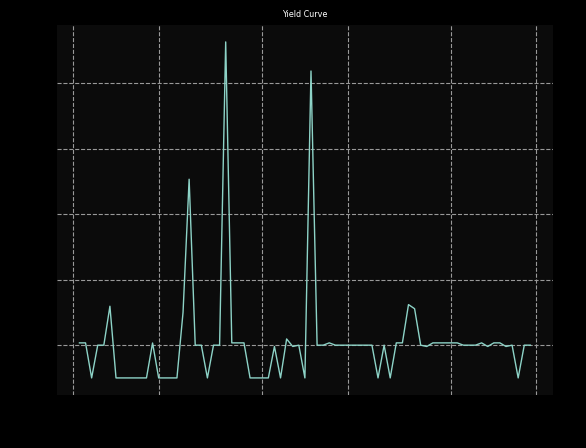

In [153]:
import matplotlib.pyplot as plt

# Calculate daily percentage change in investment
results_df['Daily Return'] = results_df['Investment'].pct_change()

# Plot yield curve
plt.plot(results_df['Date'], results_df['Daily Return'] * 100)
plt.xlabel('Date')
plt.ylabel('Daily Return (%)')
plt.title('Yield Curve')
plt.grid(True)
plt.savefig('yield_curve.png')
plt.show()